In [1]:
import pandas as pd 
import numpy as np
import math
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing 
from sklearn.linear_model import LinearRegression, Lasso, Ridge,LassoCV, RidgeCV
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import cross_validate, GridSearchCV,train_test_split
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn import metrics
import seaborn as sns
import statsmodels.formula.api as smf
import statsmodels.api as sm
plt.rcParams['font.sans-serif'] = ['SimHei']
sns.set(font='SimHei', font_scale=0.8)  
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set_context('notebook') 
sns.set_style('ticks')  
import statsmodels.formula.api as smf
import statsmodels.api as sm
from numpy import mean, median
from scipy.stats import mode

In [2]:
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [3]:
#Code for printing all results in Jupyter Notebooks
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [4]:
import scipy as sp
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

In [5]:
def fixing_skewness(df):
    """
    This function takes in a dataframe and return fixed skewed dataframe
    """
    numeric_feats = df.dtypes[df.dtypes != "object"].index

    
    skewed_feats = df[numeric_feats].apply(lambda x: x.skew()).sort_values(ascending=False)
    
    high_skew = skewed_feats[abs(skewed_feats) > 0.5]
    skewed_features = high_skew.index


    for feat in skewed_features:
        df[feat] = boxcox1p(df[feat], boxcox_normmax(df[feat] + 1))

# Dataset

## Merge the datasets

In [6]:
df1 = pd.read_csv('Extend-2020-VC copy.csv')
df1.head()
df1.shape

,Company,Year Founded,Total Raised,HQ Country,Last Financing Date,Last Financing Deal Type,Last Financing Size,Revenue
0,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN
1,AMFG,2013.0,2.15,United Kingdom,01-Jul-2020,Seed Round,1.04,NaN
2,Gravity Sketch,2014.0,3.05,United Kingdom,16-Sep-2020,Seed Round,3.00,NaN
3,Mayku,2015.0,5.15,United Kingdom,18-Aug-2020,Early Stage VC,1.16,NaN
4,MediSieve,2015.0,6.71,United Kingdom,NaN,Later Stage VC,2.50,NaN


(2405, 8)

In [7]:
df2 = pd.read_csv('Merged_UCL_data1.csv')
df2.head()
df2.shape

,Name,Company,Linkedin_url_good,image2_link,image3_link,linkedin_name,linkedin_education,linkedin_educations,linkedin_name2,linkedin_role,...,South asian combined_prop,black combined_prop,middle eastern combined_prop,white combined_prop,dominant_race_prob,dominant_race,manual_check_required,manual_check_required_gender,Gender from name,Gender from name prob
0,Henry Pinchbeck,3D LifePrints,https://uk.linkedin.com/in/henry-pinchbeck-735...,None,['https://media-exp1.licdn.com/dms/image/C5603...,None,Edinburgh University,None,Henry Pinchbeck,CEO at 3D Lifeprints,...,0.405945,0.023747,0.468280,1.083562,1.083562,white,False,NaN,male,0.991948
1,Paul Fotheringham,3D LifePrints,https://uk.linkedin.com/in/paulfotheringham,None,['https://media-exp1.licdn.com/dms/image/C4D03...,None,The University of Edinburgh,None,Paul Fotheringham,Founder of 3D LifePrints - Using Medical 3D Te...,...,0.069589,0.004694,0.662498,1.258676,1.258676,white,False,NaN,male,0.993696
2,Peter Ellingworth,3D LifePrints,https://uk.linkedin.com/in/peter-ellingworth-a...,None,"['data:image/gif;base64,R0lGODlhAQABAIAAAAAAAP...",None,Bio Products Laboratory,None,Peter Ellingworth,Critical Systems Engineer at Bio Products Labo...,...,0.000000,0.000000,0.000000,0.000000,0.441777,white,True,True,male,0.993878
3,Oluwaseyi Sosanya,Gravity Sketch,https://uk.linkedin.com/in/oluwaseyi-sosanya,None,"['data:image/gif;base64,R0lGODlhAQABAIAAAAAAAP...",None,Imperial College London,['Imperial College London\nDegree Name\nMaster...,Oluwaseyi Sosanya,Co Founder and CEO at Gravity Sketch,...,0.000000,0.000000,0.000000,0.000000,0.985171,black,True,True,male,0.586114
4,Daniel Thomas,Xihelm,https://ng.linkedin.com/in/daniel-thomas-44a5862b,None,['https://media-exp1.licdn.com/dms/image/C5603...,None,University of Hartford,['University of Hartford\nDegree Name\nMBA\nFi...,Daniel Thomas,"Finance Director at CFAO (AES), Nigeria",...,0.098194,0.493010,0.263053,0.935168,0.935168,white,True,NaN,male,0.991946


(5727, 39)

In [8]:
df= pd.merge(df1,df2,on = "Company", how = 'right')
df.head()
df.shape

,Company,Year Founded,Total Raised,HQ Country,Last Financing Date,Last Financing Deal Type,Last Financing Size,Revenue,Name,Linkedin_url_good,...,South asian combined_prop,black combined_prop,middle eastern combined_prop,white combined_prop,dominant_race_prob,dominant_race,manual_check_required,manual_check_required_gender,Gender from name,Gender from name prob
0,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Henry Pinchbeck,https://uk.linkedin.com/in/henry-pinchbeck-735...,...,0.405945,0.023747,0.468280,1.083562,1.083562,white,False,NaN,male,0.991948
1,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Paul Fotheringham,https://uk.linkedin.com/in/paulfotheringham,...,0.069589,0.004694,0.662498,1.258676,1.258676,white,False,NaN,male,0.993696
2,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Peter Ellingworth,https://uk.linkedin.com/in/peter-ellingworth-a...,...,0.000000,0.000000,0.000000,0.000000,0.441777,white,True,True,male,0.993878
3,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Matthew Gailer,https://www.3dlifeprints.com/about-us/the-team/,...,0.000000,0.000000,0.000000,0.000000,0.519930,white,True,True,male,0.996717
4,AMFG,2013.0,2.15,United Kingdom,01-Jul-2020,Seed Round,1.04,NaN,Keyvan Karimi,https://uk.linkedin.com/in/keyvank,...,0.044309,0.003502,1.117915,0.823939,1.117915,middle eastern,False,False,male,0.993669


(5727, 46)

## Create new variable

In [9]:
# this is the dictionary which is needed
education_categories = {'Elite':'Harvard|INSEAD|London Business School|MIT Sloan School of Management|Massachusetts|Standford|University of Oxford|University of Cambridge',
                        'Tier1':'University of Pennsylvania|EPFL|Bocconi University|Yale University|HEC|California Institute of Technology|Imperial College London|ETH Zurich|UCL|University College London|University of Chicago|NUS|NTU',
                        'Tier2':'University of Edinburgh|Edinburgh University|The London School of Economics and Political science|Northwestern University|Copenhagen|Tsinghua University|Peking University|Columbia University|Columbia Business School|Princeton University|Cornell University|Cornell Johnson Graduate School of Management|The university of Hong Kong|Tokyo|University of Michigan|The Johns Hopkins University|Berkeley'}

for i in education_categories.values():
    print (i)

Harvard|INSEAD|London Business School|MIT Sloan School of Management|Massachusetts|Standford|University of Oxford|University of Cambridge
University of Pennsylvania|EPFL|Bocconi University|Yale University|HEC|California Institute of Technology|Imperial College London|ETH Zurich|UCL|University College London|University of Chicago|NUS|NTU
University of Edinburgh|Edinburgh University|The London School of Economics and Political science|Northwestern University|Copenhagen|Tsinghua University|Peking University|Columbia University|Columbia Business School|Princeton University|Cornell University|Cornell Johnson Graduate School of Management|The university of Hong Kong|Tokyo|University of Michigan|The Johns Hopkins University|Berkeley


In [10]:
# creat new Column + search the dictinary

df['Education_level']='Other'

for i, j in education_categories.items():
    df.loc[df['linkedin_education'].str.contains(j),'Education_level'] = i
df

,Company,Year Founded,Total Raised,HQ Country,Last Financing Date,Last Financing Deal Type,Last Financing Size,Revenue,Name,Linkedin_url_good,...,black combined_prop,middle eastern combined_prop,white combined_prop,dominant_race_prob,dominant_race,manual_check_required,manual_check_required_gender,Gender from name,Gender from name prob,Education_level
0,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Henry Pinchbeck,https://uk.linkedin.com/in/henry-pinchbeck-735...,...,0.023747,0.468280,1.083562,1.083562,white,False,NaN,male,0.991948,Tier2
1,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Paul Fotheringham,https://uk.linkedin.com/in/paulfotheringham,...,0.004694,0.662498,1.258676,1.258676,white,False,NaN,male,0.993696,Tier2
2,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Peter Ellingworth,https://uk.linkedin.com/in/peter-ellingworth-a...,...,0.000000,0.000000,0.000000,0.441777,white,True,True,male,0.993878,Other
3,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Matthew Gailer,https://www.3dlifeprints.com/about-us/the-team/,...,0.000000,0.000000,0.000000,0.519930,white,True,True,male,0.996717,Other
4,AMFG,2013.0,2.15,United Kingdom,01-Jul-2020,Seed Round,1.04,NaN,Keyvan Karimi,https://uk.linkedin.com/in/keyvank,...,0.003502,1.117915,0.823939,1.117915,middle eastern,False,False,male,0.993669,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5722,Zentraxa,2017.0,1.29,United Kingdom,04-Feb-2021,Early Stage VC,0.46,NaN,Steven Burston,https://uk.linkedin.com/in/steven-burston-003a217,...,0.000701,0.347947,1.638623,1.638623,white,False,NaN,male,0.991836,Other
5723,Zentraxa,2017.0,1.29,United Kingdom,04-Feb-2021,Early Stage VC,0.46,NaN,Harriet Bray,https://uk.linkedin.com/in/harriet-bray-3b944431,...,0.000000,0.000000,0.000000,0.723274,white,True,True,female,0.710723,Other
5724,Zing Dev,2018.0,NaN,United Kingdom,04-Jun-2020,Early Stage VC,NaN,NaN,Julian Hucker,https://uk.linkedin.com/in/julianhucker,...,0.001571,0.555574,1.398876,1.398876,white,False,NaN,male,0.941116,Other
5725,Zing Dev,2018.0,NaN,United Kingdom,04-Jun-2020,Early Stage VC,NaN,NaN,Tanya Warnford-Davis,https://uk.linkedin.com/in/tanyawarnforddavisfcma,...,0.000002,0.464810,1.527888,1.527888,white,False,NaN,female,0.979516,Other


In [11]:
df['Education_level'].unique()
df['Education_level'].nunique()
df['Education_level'].value_counts()

array(['Tier2', 'Other', 'Tier1', 'Elite'], dtype=object)

4

Other    4598
Elite     679
Tier1     271
Tier2     179
Name: Education_level, dtype: int64

In [12]:
# creat new variable 'Duration' which represents how many years the company was founded
df['Duration'] = 2021-df['Year Founded']

In [13]:
# this is the dictionary which is needed
LastfinanceType_categories = {'Angel':'Angel',
                        'Seed Round':'Seed Round',
                        'Early Stage VC':'Early Stage VC',
                         'Later Stage VC':'Later Stage VC'}

for i in LastfinanceType_categories.values():
    print (i)

Angel
Seed Round
Early Stage VC
Later Stage VC


In [14]:
df['Last Financing Deal Type'].isnull().sum()
df['Last Financing Deal Type'].fillna('other',inplace=True)

1

In [15]:
df['LastfinanceType']='Other'

for i, j in LastfinanceType_categories.items():
    df.loc[df['Last Financing Deal Type'].str.contains(j),'LastfinanceType'] = i
df
df.shape

,Company,Year Founded,Total Raised,HQ Country,Last Financing Date,Last Financing Deal Type,Last Financing Size,Revenue,Name,Linkedin_url_good,...,white combined_prop,dominant_race_prob,dominant_race,manual_check_required,manual_check_required_gender,Gender from name,Gender from name prob,Education_level,Duration,LastfinanceType
0,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Henry Pinchbeck,https://uk.linkedin.com/in/henry-pinchbeck-735...,...,1.083562,1.083562,white,False,NaN,male,0.991948,Tier2,8.0,Later Stage VC
1,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Paul Fotheringham,https://uk.linkedin.com/in/paulfotheringham,...,1.258676,1.258676,white,False,NaN,male,0.993696,Tier2,8.0,Later Stage VC
2,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Peter Ellingworth,https://uk.linkedin.com/in/peter-ellingworth-a...,...,0.000000,0.441777,white,True,True,male,0.993878,Other,8.0,Later Stage VC
3,3D LifePrints,2013.0,1.88,United Kingdom,18-Mar-2020,Later Stage VC,1.21,NaN,Matthew Gailer,https://www.3dlifeprints.com/about-us/the-team/,...,0.000000,0.519930,white,True,True,male,0.996717,Other,8.0,Later Stage VC
4,AMFG,2013.0,2.15,United Kingdom,01-Jul-2020,Seed Round,1.04,NaN,Keyvan Karimi,https://uk.linkedin.com/in/keyvank,...,0.823939,1.117915,middle eastern,False,False,male,0.993669,Other,8.0,Seed Round
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5722,Zentraxa,2017.0,1.29,United Kingdom,04-Feb-2021,Early Stage VC,0.46,NaN,Steven Burston,https://uk.linkedin.com/in/steven-burston-003a217,...,1.638623,1.638623,white,False,NaN,male,0.991836,Other,4.0,Early Stage VC
5723,Zentraxa,2017.0,1.29,United Kingdom,04-Feb-2021,Early Stage VC,0.46,NaN,Harriet Bray,https://uk.linkedin.com/in/harriet-bray-3b944431,...,0.000000,0.723274,white,True,True,female,0.710723,Other,4.0,Early Stage VC
5724,Zing Dev,2018.0,NaN,United Kingdom,04-Jun-2020,Early Stage VC,NaN,NaN,Julian Hucker,https://uk.linkedin.com/in/julianhucker,...,1.398876,1.398876,white,False,NaN,male,0.941116,Other,3.0,Early Stage VC
5725,Zing Dev,2018.0,NaN,United Kingdom,04-Jun-2020,Early Stage VC,NaN,NaN,Tanya Warnford-Davis,https://uk.linkedin.com/in/tanyawarnforddavisfcma,...,1.527888,1.527888,white,False,NaN,female,0.979516,Other,3.0,Early Stage VC


(5727, 49)

In [16]:
df_final=df.copy()

In [17]:
df_final.drop(columns=['Company', 'HQ Country','Name','Year Founded','Last Financing Deal Type',
                          'linkedin_education','Last Financing Date','linkedin_place',
                          'Revenue', 'Linkedin_url_good',
       'image2_link', 'image3_link', 'linkedin_name',
       'linkedin_educations', 'linkedin_name2', 'linkedin_role',
       'linkedin_experience_bar1',
       'linkedin_experience_bar2', 'Image file name', 'directorname',
       'gender_from_pic', 'gender_from_name', 'gender_from_name_prob',
       'east_asian_prob_from_pic', 'south_asian_prob_from_pic',
       'black_prob_from_pic', 'white_prob_from_pic',
       'middle_eastern_prob_from_pic', 'east_asian_prob_from_name',
       'south_asian_prob_from_name', 'black_prob_from_name',
       'middle_eastern_prob_from_name', 'white_prob_from_name',
       'East asian combined_prop', 'South asian combined_prop',
       'black combined_prop', 'middle eastern combined_prop',
       'white combined_prop', 'dominant_race_prob',
       'manual_check_required', 'manual_check_required_gender',
       'Gender from name prob'],inplace=True)
df_final.head()
df_final.shape
df_final.columns

,Total Raised,Last Financing Size,dominant_race,Gender from name,Education_level,Duration,LastfinanceType
0,1.88,1.21,white,male,Tier2,8.0,Later Stage VC
1,1.88,1.21,white,male,Tier2,8.0,Later Stage VC
2,1.88,1.21,white,male,Other,8.0,Later Stage VC
3,1.88,1.21,white,male,Other,8.0,Later Stage VC
4,2.15,1.04,middle eastern,male,Other,8.0,Seed Round


(5727, 7)

Index(['Total Raised', 'Last Financing Size', 'dominant_race',
       'Gender from name', 'Education_level', 'Duration', 'LastfinanceType'],
      dtype='object')

## Data Exploration

### Gender

Text(0.5, 1.0, 'Gender')

(array([0, 1]), <a list of 2 Text major ticklabel objects>)

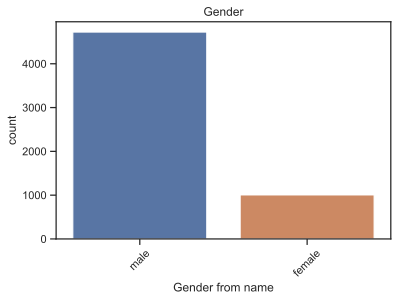

In [18]:
sns.countplot(df_final['Gender from name'])
plt.title('Gender')
plt.xticks(rotation=45)
plt.show()

In [19]:
df['Gender from name'].value_counts()

male      4723
female    1004
Name: Gender from name, dtype: int64

### Dominant race

Text(0.5, 1.0, 'dominant_race')

(array([0, 1, 2, 3, 4]), <a list of 5 Text major ticklabel objects>)

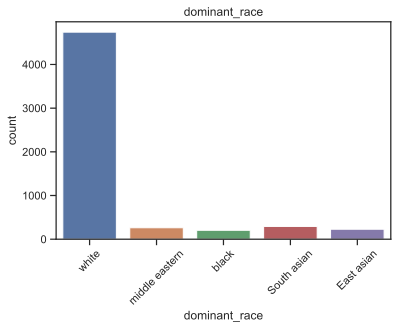

In [20]:
sns.countplot(df_final['dominant_race'])
plt.title('dominant_race')
plt.xticks(rotation=45)
plt.show()

In [21]:
df['dominant_race'].value_counts()

white             4740
South asian        293
middle eastern     262
East asian         228
black              204
Name: dominant_race, dtype: int64

### Education Level

Text(0.5, 1.0, 'Education_level')

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

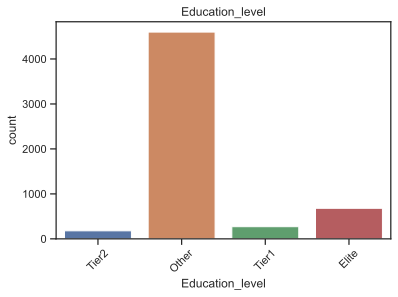

In [22]:
sns.countplot(df_final['Education_level'])
plt.title('Education_level')
plt.xticks(rotation=45)
plt.show()

### Intersectionality

(array([0, 1, 2, 3, 4]), <a list of 5 Text major ticklabel objects>)

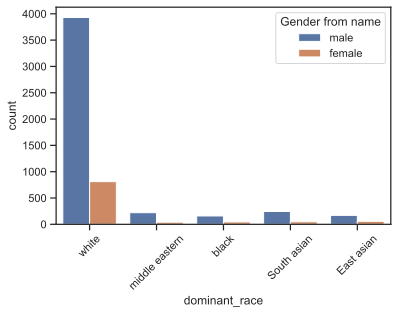

In [23]:
sns.countplot(x="dominant_race", hue="Gender from name",
                 data=df_final)
plt.xticks(rotation=45)
plt.show()

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

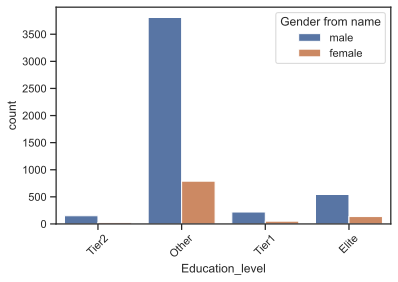

In [24]:
sns.countplot(x="Education_level", hue="Gender from name",
                 data=df_final)
plt.xticks(rotation=45)
plt.show()

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

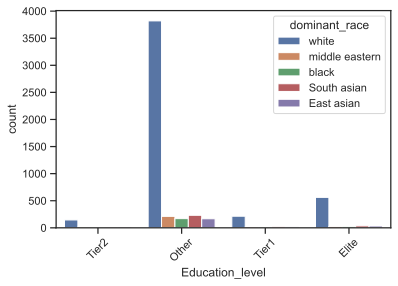

In [25]:
sns.countplot(x="Education_level", hue="dominant_race",
                 data=df_final)
plt.xticks(rotation=45)
plt.show()

### Last Finance type

Text(0.5, 1.0, 'Last Financing Deal Type')

(array([0, 1, 2, 3, 4]), <a list of 5 Text major ticklabel objects>)

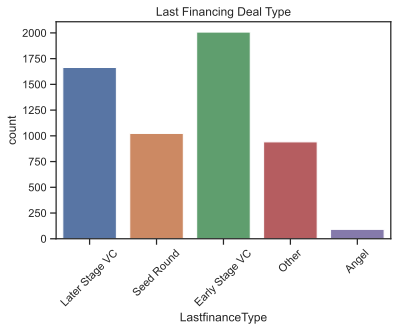

In [26]:
sns.countplot(df_final['LastfinanceType'])
plt.title('Last Financing Deal Type')
plt.xticks(rotation=45)
plt.show()

(array([0, 1, 2, 3, 4]), <a list of 5 Text major ticklabel objects>)

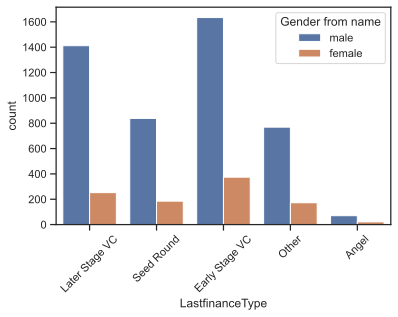

In [27]:
sns.countplot(x="LastfinanceType", hue="Gender from name",
                 data=df_final)
plt.xticks(rotation=45)
plt.show()

(array([0, 1, 2, 3, 4]), <a list of 5 Text major ticklabel objects>)

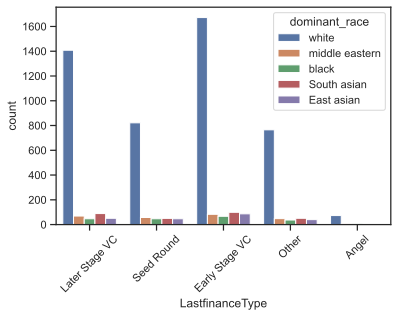

In [28]:
sns.countplot(x="LastfinanceType", hue="dominant_race",
                 data=df_final)
plt.xticks(rotation=45)
plt.show()

(array([0, 1, 2, 3, 4]), <a list of 5 Text major ticklabel objects>)

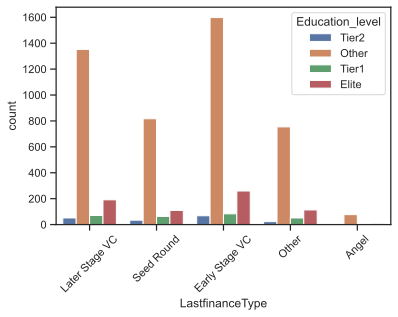

In [29]:
sns.countplot(x="LastfinanceType", hue="Education_level",
                 data=df_final)
plt.xticks(rotation=45)
plt.show()

### Last Finance size

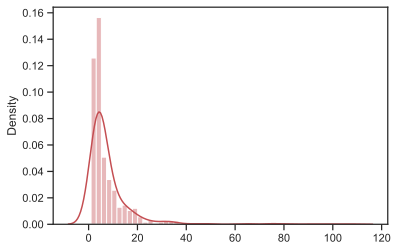

In [30]:
sns.set_color_codes()
sns.distplot(df_final['Last Financing Size'].value_counts().values,color='r')
plt.show()

In [31]:
print("Skewness: %.2f" % df['Last Financing Size'].skew())
print("Kurtosis: %.2f" % df['Last Financing Size'].kurt())

Skewness: 9.45
Kurtosis: 111.97


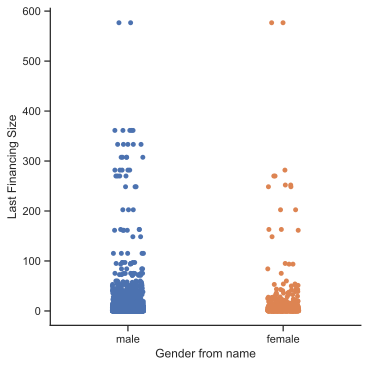

In [32]:
sns.catplot(x="Gender from name", y="Last Financing Size", data=df_final)

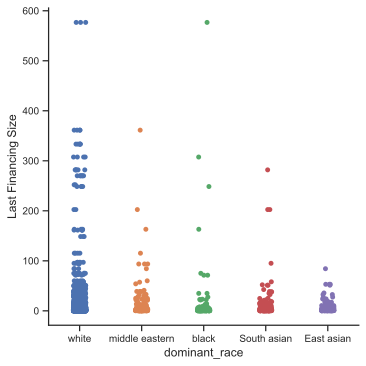

In [33]:
sns.catplot(x="dominant_race", y="Last Financing Size", data=df_final)
plt.tick_params(labelsize=10)

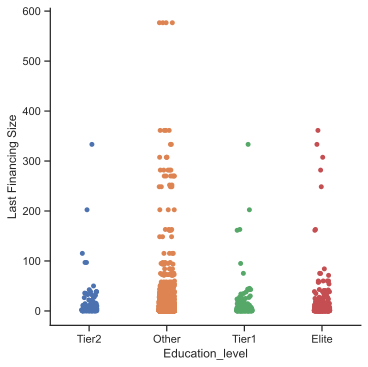

In [34]:
sns.catplot(x="Education_level", y="Last Financing Size", data=df_final)

### Duration

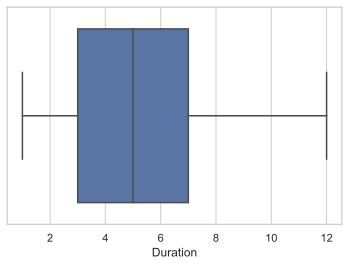

In [35]:
sns.set(style='whitegrid')
sns.boxplot(df_final['Duration'])
plt.show()

### Dependent Variable Derivation

<Figure size 1440x720 with 0 Axes>

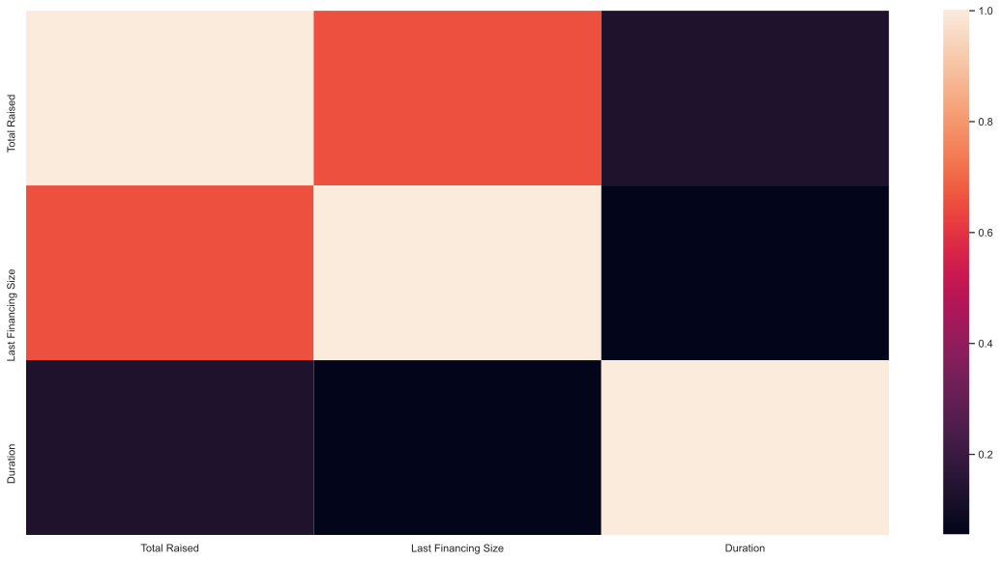

In [36]:
# Draw the heatmap.
corr = df_final.corr()
plt.figure(figsize=(20,10))
sns.heatmap(corr)
plt.show()

In [37]:
# Features are sorted by the size of the correlation coefficient.
corr.loc['Total Raised'].sort_values(ascending=False)[1:]

Last Financing Size    0.653844
Duration               0.130865
Name: Total Raised, dtype: float64

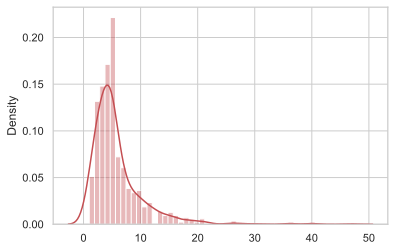

In [38]:
sns.set_color_codes()
sns.distplot(df_final['Total Raised'].value_counts().values,color='r')
plt.show()

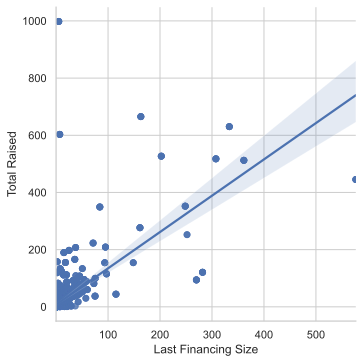

In [39]:
# Show the results of a linear regression within each dataset
sns.lmplot(x="Last Financing Size", y="Total Raised", data=df_final)
plt.show()

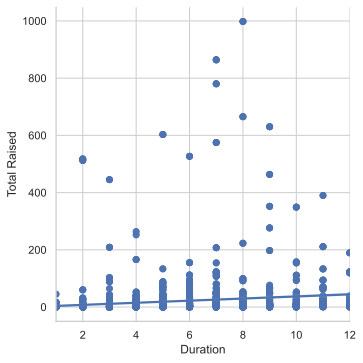

In [40]:
# Show the results of a linear regression within each dataset
sns.lmplot(x="Duration", y="Total Raised", data=df_final)
plt.show()

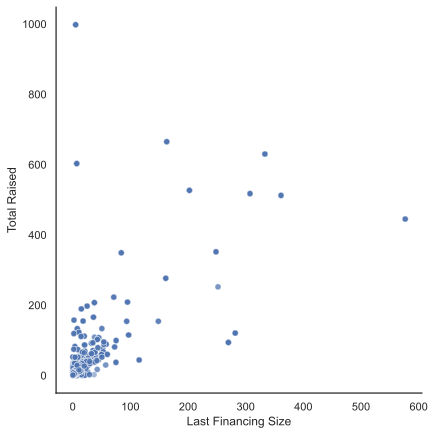

In [41]:
sns.set(style="white")
sns.relplot(x="Last Financing Size",y="Total Raised",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=df_final)
plt.show()

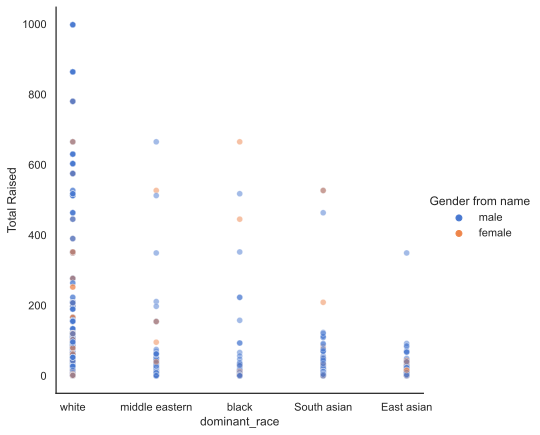

In [42]:
sns.set(style="white")
sns.relplot(x="dominant_race",y="Total Raised",hue="Gender from name",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=df_final)
plt.show()

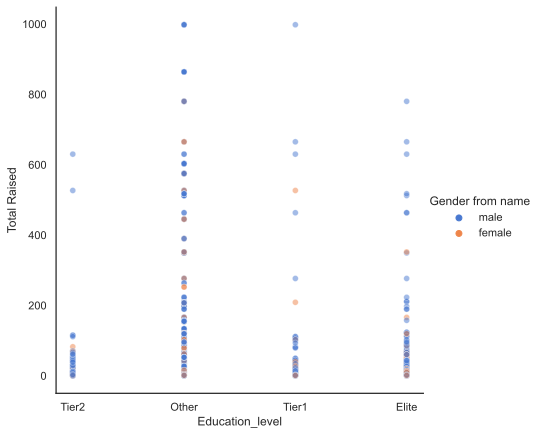

In [43]:
sns.set(style="white")
sns.relplot(x="Education_level",y="Total Raised",hue="Gender from name",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=df_final)
plt.show()

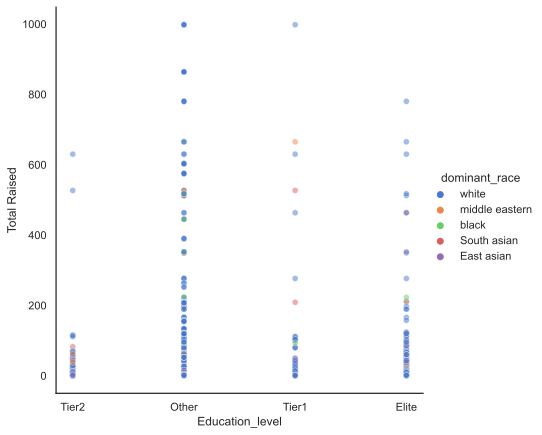

In [44]:
sns.set(style="white")
sns.relplot(x="Education_level",y="Total Raised",hue="dominant_race",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=df_final)
plt.show()

## Data cleaning 

### Missing value

In [45]:
df_final.isnull().sum()

Total Raised           270
Last Financing Size    980
dominant_race            0
Gender from name         0
Education_level          0
Duration                 1
LastfinanceType          0
dtype: int64

In [46]:
# check how many missing value in the colomn of 'Total Raised'
df_final['Total Raised'].isnull().value_counts()
df_final= df_final.dropna(how='any',subset=['Total Raised'])

False    5457
True      270
Name: Total Raised, dtype: int64

In [47]:
df_final['Last Financing Size'].isnull().value_counts()

False    4707
True      750
Name: Last Financing Size, dtype: int64

In [48]:
mean=np.mean(df_final['Last Financing Size'].dropna())

In [49]:
df_final['Last Financing Size'].fillna(mean,inplace=True)

In [50]:
mean=np.mean(df_final['Duration'].dropna())

In [51]:
df_final['Duration'].fillna(mean,inplace=True)

In [52]:
df_final.isnull().any()

Total Raised           False
Last Financing Size    False
dominant_race          False
Gender from name       False
Education_level        False
Duration               False
LastfinanceType        False
dtype: bool

In [53]:
df_final
df_final.shape

,Total Raised,Last Financing Size,dominant_race,Gender from name,Education_level,Duration,LastfinanceType
0,1.88,1.21,white,male,Tier2,8.0,Later Stage VC
1,1.88,1.21,white,male,Tier2,8.0,Later Stage VC
2,1.88,1.21,white,male,Other,8.0,Later Stage VC
3,1.88,1.21,white,male,Other,8.0,Later Stage VC
4,2.15,1.04,middle eastern,male,Other,8.0,Seed Round
...,...,...,...,...,...,...,...
5719,1.29,0.46,white,male,Other,4.0,Early Stage VC
5720,1.29,0.46,white,male,Other,4.0,Early Stage VC
5721,1.29,0.46,white,male,Other,4.0,Early Stage VC
5722,1.29,0.46,white,male,Other,4.0,Early Stage VC


(5457, 7)

###  One-hot

In [54]:
columns=['LastfinanceType','Education_level','Gender from name','dominant_race']
df_onehot=pd.get_dummies(df_final,columns=columns, prefix=columns,prefix_sep="_")
df_onehot
#To avoid the effect of Multicollinearity
df_onehot.drop(['LastfinanceType_Other','Education_level_Other','Gender from name_male','dominant_race_black'],axis=1,inplace=True)
df_onehot.head(5)

,Total Raised,Last Financing Size,Duration,LastfinanceType_Angel,LastfinanceType_Early Stage VC,LastfinanceType_Later Stage VC,LastfinanceType_Other,LastfinanceType_Seed Round,Education_level_Elite,Education_level_Other,Education_level_Tier1,Education_level_Tier2,Gender from name_female,Gender from name_male,dominant_race_East asian,dominant_race_South asian,dominant_race_black,dominant_race_middle eastern,dominant_race_white
0,1.88,1.21,8.0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1
1,1.88,1.21,8.0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1
2,1.88,1.21,8.0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1
3,1.88,1.21,8.0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1
4,2.15,1.04,8.0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5719,1.29,0.46,4.0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1
5720,1.29,0.46,4.0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1
5721,1.29,0.46,4.0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1
5722,1.29,0.46,4.0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1


,Total Raised,Last Financing Size,Duration,LastfinanceType_Angel,LastfinanceType_Early Stage VC,LastfinanceType_Later Stage VC,LastfinanceType_Seed Round,Education_level_Elite,Education_level_Tier1,Education_level_Tier2,Gender from name_female,dominant_race_East asian,dominant_race_South asian,dominant_race_middle eastern,dominant_race_white
0,1.88,1.21,8.0,0,0,1,0,0,0,1,0,0,0,0,1
1,1.88,1.21,8.0,0,0,1,0,0,0,1,0,0,0,0,1
2,1.88,1.21,8.0,0,0,1,0,0,0,0,0,0,0,0,1
3,1.88,1.21,8.0,0,0,1,0,0,0,0,0,0,0,0,1
4,2.15,1.04,8.0,0,0,0,1,0,0,0,0,0,0,1,0


## Continuous feature processing

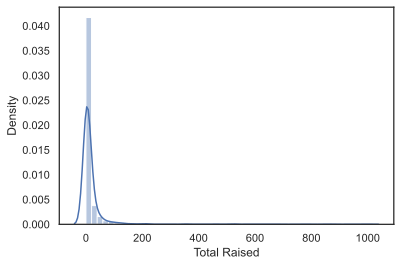

In [55]:
sns.distplot(df_onehot['Total Raised'])

In [56]:
df_onehot['Total Raised']

0       1.88
1       1.88
2       1.88
3       1.88
4       2.15
        ... 
5719    1.29
5720    1.29
5721    1.29
5722    1.29
5723    1.29
Name: Total Raised, Length: 5457, dtype: float64

In [57]:
#skewness and kurtosis
print("Skewness: %.2f" % df['Total Raised'].skew())
print("Kurtosis: %.2f" % df['Total Raised'].kurt())

Skewness: 7.94
Kurtosis: 73.34


In [58]:
df_onehot

,Total Raised,Last Financing Size,Duration,LastfinanceType_Angel,LastfinanceType_Early Stage VC,LastfinanceType_Later Stage VC,LastfinanceType_Seed Round,Education_level_Elite,Education_level_Tier1,Education_level_Tier2,Gender from name_female,dominant_race_East asian,dominant_race_South asian,dominant_race_middle eastern,dominant_race_white
0,1.88,1.21,8.0,0,0,1,0,0,0,1,0,0,0,0,1
1,1.88,1.21,8.0,0,0,1,0,0,0,1,0,0,0,0,1
2,1.88,1.21,8.0,0,0,1,0,0,0,0,0,0,0,0,1
3,1.88,1.21,8.0,0,0,1,0,0,0,0,0,0,0,0,1
4,2.15,1.04,8.0,0,0,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5719,1.29,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1
5720,1.29,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1
5721,1.29,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1
5722,1.29,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1


In [59]:
df_y=df_final[['Total Raised']]
df_y

,Total Raised
0,1.88
1,1.88
2,1.88
3,1.88
4,2.15
...,...
5719,1.29
5720,1.29
5721,1.29
5722,1.29


In [60]:
fixing_skewness(df_y)
#skewness and kurtosis
print("Skewness: %.2f" % df_y['Total Raised'].skew())
print("Kurtosis: %.2f" % df_y['Total Raised'].kurt())

Skewness: 0.11
Kurtosis: -0.90


In [61]:
# KS test
from scipy import stats
u = df_y['Total Raised'].mean()  # calculate the mean value
std = df_y['Total Raised'].std()  # calculate the sd
stats.kstest(df_y['Total Raised'], 'norm', (u, std))

KstestResult(statistic=0.048978031004606626, pvalue=8.146294859981654e-12)

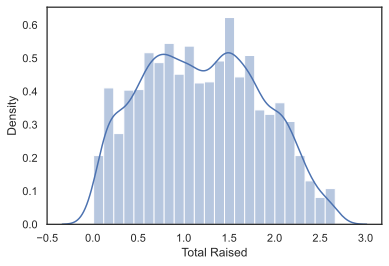

In [62]:
sns.distplot(df_y['Total Raised'])

In [63]:
# Continuous variables are normalized.
scaler = MinMaxScaler(feature_range=(0,1), copy=True)
for col in list(df_y.columns):
    df_y[col] = scaler.fit_transform(df_y[[col]])
df_y

,Total Raised
0,0.330792
1,0.330792
2,0.330792
3,0.330792
4,0.354003
...,...
5719,0.268108
5720,0.268108
5721,0.268108
5722,0.268108


In [64]:
Y=df_y['Total Raised'].values
X=df_onehot.drop('Total Raised',axis=1).values

In [65]:
Y
X

array([0.33079229, 0.33079229, 0.33079229, ..., 0.26810801, 0.26810801,
       0.26810801])

array([[1.21, 8.  , 0.  , ..., 0.  , 0.  , 1.  ],
       [1.21, 8.  , 0.  , ..., 0.  , 0.  , 1.  ],
       [1.21, 8.  , 0.  , ..., 0.  , 0.  , 1.  ],
       ...,
       [0.46, 4.  , 0.  , ..., 0.  , 0.  , 1.  ],
       [0.46, 4.  , 0.  , ..., 0.  , 0.  , 1.  ],
       [0.46, 4.  , 0.  , ..., 0.  , 0.  , 1.  ]])

In [66]:
df_onehot.insert(0, 'Total_Raised_scale', Y, allow_duplicates=False)
df_onehot

,Total_Raised_scale,Total Raised,Last Financing Size,Duration,LastfinanceType_Angel,LastfinanceType_Early Stage VC,LastfinanceType_Later Stage VC,LastfinanceType_Seed Round,Education_level_Elite,Education_level_Tier1,Education_level_Tier2,Gender from name_female,dominant_race_East asian,dominant_race_South asian,dominant_race_middle eastern,dominant_race_white
0,0.330792,1.88,1.21,8.0,0,0,1,0,0,0,1,0,0,0,0,1
1,0.330792,1.88,1.21,8.0,0,0,1,0,0,0,1,0,0,0,0,1
2,0.330792,1.88,1.21,8.0,0,0,1,0,0,0,0,0,0,0,0,1
3,0.330792,1.88,1.21,8.0,0,0,1,0,0,0,0,0,0,0,0,1
4,0.354003,2.15,1.04,8.0,0,0,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5719,0.268108,1.29,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1
5720,0.268108,1.29,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1
5721,0.268108,1.29,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1
5722,0.268108,1.29,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1


In [67]:
df_final.insert(0, 'Total_Raised_scale', Y, allow_duplicates=False)
df_final

,Total_Raised_scale,Total Raised,Last Financing Size,dominant_race,Gender from name,Education_level,Duration,LastfinanceType
0,0.330792,1.88,1.21,white,male,Tier2,8.0,Later Stage VC
1,0.330792,1.88,1.21,white,male,Tier2,8.0,Later Stage VC
2,0.330792,1.88,1.21,white,male,Other,8.0,Later Stage VC
3,0.330792,1.88,1.21,white,male,Other,8.0,Later Stage VC
4,0.354003,2.15,1.04,middle eastern,male,Other,8.0,Seed Round
...,...,...,...,...,...,...,...,...
5719,0.268108,1.29,0.46,white,male,Other,4.0,Early Stage VC
5720,0.268108,1.29,0.46,white,male,Other,4.0,Early Stage VC
5721,0.268108,1.29,0.46,white,male,Other,4.0,Early Stage VC
5722,0.268108,1.29,0.46,white,male,Other,4.0,Early Stage VC


In [68]:
df["Total Raised"].describe()
df["Last Financing Size"].describe()
df["Duration"].describe()

count    5457.000000
mean       20.817839
std        75.575500
min         0.010000
25%         1.200000
50%         3.570000
75%        11.740000
max       998.130000
Name: Total Raised, dtype: float64

count    4747.000000
mean        9.072631
std        33.513586
min         0.010000
25%         0.600000
50%         1.800000
75%         5.465000
max       576.720000
Name: Last Financing Size, dtype: float64

count    5726.000000
mean        5.488299
std         2.709025
min         1.000000
25%         3.000000
50%         5.000000
75%         7.000000
max        12.000000
Name: Duration, dtype: float64

In [69]:
df_final_r=df_final.replace("white",1)
df_final_r=df_final_r.replace("black",0)
df_final_r=df_final_r.replace("middle eastern",2)
df_final_r=df_final_r.replace("South asian",3)
df_final_r=df_final_r.replace("East asian",4)

In [70]:
df_final_r=df_final_r.replace("male",0)
df_final_r=df_final_r.replace("female",1)

In [71]:
df_final_r=df_final_r.replace("Early Stage VC",0)
df_final_r=df_final_r.replace("Later Stage VC",1)
df_final_r=df_final_r.replace("Seed Round",2)
df_final_r=df_final_r.replace("Other",3)
df_final_r=df_final_r.replace("Angel",4)

In [72]:
df_final_r=df_final_r.replace("Tier1",0)
df_final_r=df_final_r.replace("Tier2",1)

In [73]:
df_final_r=df_final_r.replace("Elite",3)

In [74]:
df["LastfinanceType"].value_counts()

Early Stage VC    2008
Later Stage VC    1664
Seed Round        1023
Other              941
Angel               91
Name: LastfinanceType, dtype: int64

In [75]:
df_final_r=df_final_r.drop("Total_Raised_scale",axis=1)

<Figure size 1440x720 with 0 Axes>

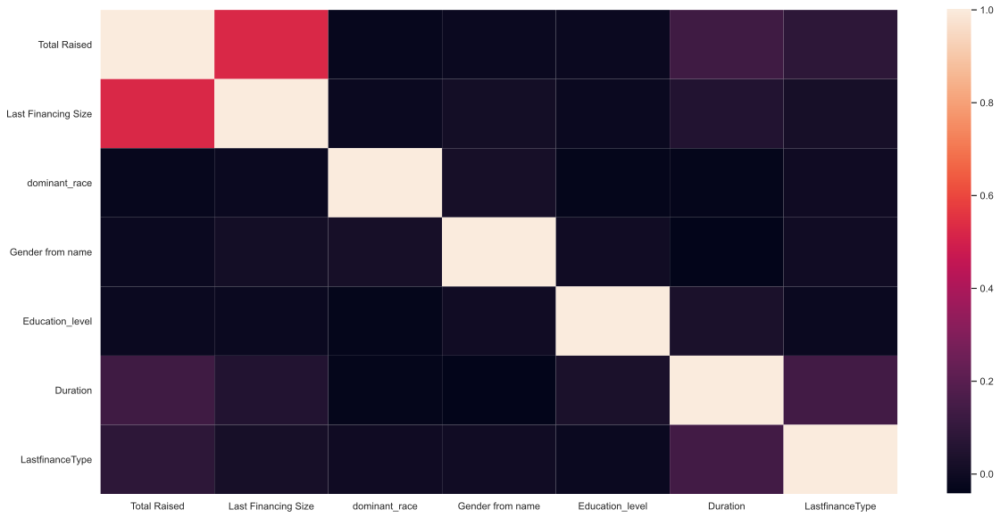

In [76]:
corr = df_final_r.corr()
plt.figure(figsize=(20,10))
sns.heatmap(corr)
plt.show()

In [77]:
corr.loc['Total Raised'].sort_values(ascending=False)[1:]

Last Financing Size    0.524968
Duration               0.130865
LastfinanceType        0.082070
Gender from name      -0.011707
Education_level       -0.013844
dominant_race         -0.022728
Name: Total Raised, dtype: float64

<Figure size 1440x720 with 0 Axes>

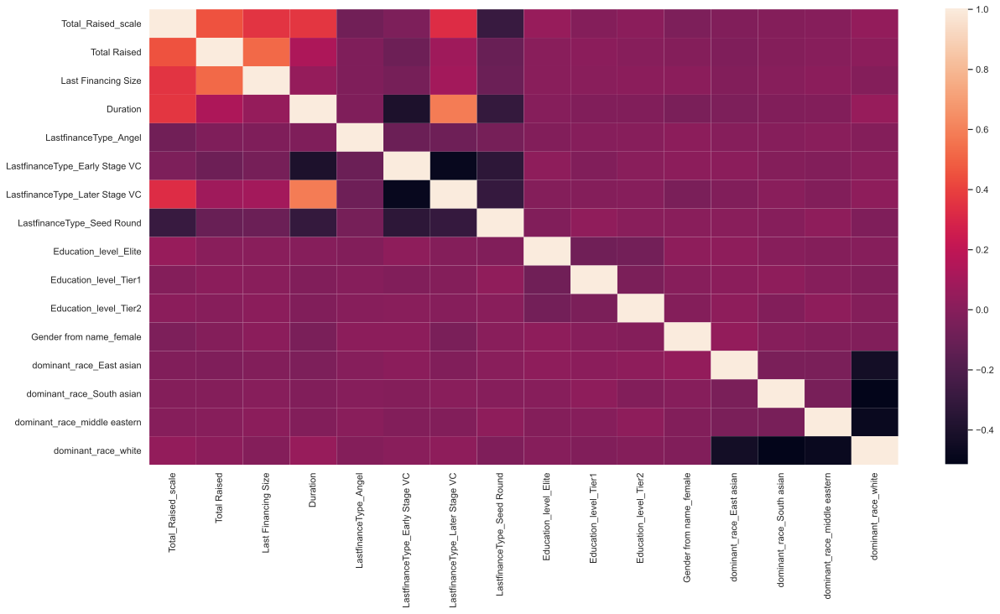

In [78]:
# Draw df_finalheatmap.
corr = df_onehot.corr()
plt.figure(figsize=(20,10))
sns.heatmap(corr)
plt.show()

In [79]:
# Features are sorted by the size of the correlation coefficient.
corr.loc['Last Financing Size'].sort_values(ascending=False)[1:]

Total Raised                      0.524968
Total_Raised_scale                0.356073
LastfinanceType_Later Stage VC    0.096249
Duration                          0.050924
dominant_race_middle eastern      0.016887
Education_level_Tier2             0.015737
Gender from name_female           0.011656
Education_level_Tier1             0.007079
Education_level_Elite             0.005302
dominant_race_South asian         0.000967
dominant_race_white              -0.008153
dominant_race_East asian         -0.016958
LastfinanceType_Angel            -0.028047
LastfinanceType_Early Stage VC   -0.055197
LastfinanceType_Seed Round       -0.095549
Name: Last Financing Size, dtype: float64

In [80]:
col_names = list(df_final_r.columns)

In [81]:
col_names

['Total Raised',
 'Last Financing Size',
 'dominant_race',
 'Gender from name',
 'Education_level',
 'Duration',
 'LastfinanceType']

In [82]:
# multicollinearity test 
feat = df_final_r.iloc[:,1:]
import statsmodels.api as sm
for i in range(0,len(feat.columns)):
    y = feat.iloc[:,feat.columns == feat.columns[i]]
    x = feat.iloc[:,feat.columns!=feat.columns[i]]
    mod = sm.OLS(y,x)  # fitting linear reg model of one of the feat_var w.r.t all the other feature vars.
    result = mod.fit()
    rsq = result.rsquared
    vif = 1/(1-rsq)
    print("Rsquared value of ",feat.columns[i],"is:",round(rsq,2), "keeping all other columns as features!")
    print("VIF value of ",feat.columns[i],"is:",round(vif,2))
    print("")

Rsquared value of  Last Financing Size is: 0.08 keeping all other columns as features!
VIF value of  Last Financing Size is: 1.09

Rsquared value of  dominant_race is: 0.68 keeping all other columns as features!
VIF value of  dominant_race is: 3.16

Rsquared value of  Gender from name is: 0.17 keeping all other columns as features!
VIF value of  Gender from name is: 1.2

Rsquared value of  Education_level is: 0.84 keeping all other columns as features!
VIF value of  Education_level is: 6.16

Rsquared value of  Duration is: 0.79 keeping all other columns as features!
VIF value of  Duration is: 4.71

Rsquared value of  LastfinanceType is: 0.52 keeping all other columns as features!
VIF value of  LastfinanceType is: 2.1



# Explore different models

In [83]:
df_onehot.drop(['Total Raised'],axis=1,inplace=True)

In [84]:
df_onehot

,Total_Raised_scale,Last Financing Size,Duration,LastfinanceType_Angel,LastfinanceType_Early Stage VC,LastfinanceType_Later Stage VC,LastfinanceType_Seed Round,Education_level_Elite,Education_level_Tier1,Education_level_Tier2,Gender from name_female,dominant_race_East asian,dominant_race_South asian,dominant_race_middle eastern,dominant_race_white
0,0.330792,1.21,8.0,0,0,1,0,0,0,1,0,0,0,0,1
1,0.330792,1.21,8.0,0,0,1,0,0,0,1,0,0,0,0,1
2,0.330792,1.21,8.0,0,0,1,0,0,0,0,0,0,0,0,1
3,0.330792,1.21,8.0,0,0,1,0,0,0,0,0,0,0,0,1
4,0.354003,1.04,8.0,0,0,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5719,0.268108,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1
5720,0.268108,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1
5721,0.268108,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1
5722,0.268108,0.46,4.0,0,1,0,0,0,0,0,0,0,0,0,1


In [85]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [86]:
len(y_test)

1092

In [87]:
x_cols=list(df_onehot.columns)
x_cols.remove('Total_Raised_scale')

In [88]:
x_cols

['Last Financing Size',
 'Duration',
 'LastfinanceType_Angel',
 'LastfinanceType_Early Stage VC',
 'LastfinanceType_Later Stage VC',
 'LastfinanceType_Seed Round',
 'Education_level_Elite',
 'Education_level_Tier1',
 'Education_level_Tier2',
 'Gender from name_female',
 'dominant_race_East asian',
 'dominant_race_South asian',
 'dominant_race_middle eastern',
 'dominant_race_white']

In [89]:
data_fit={}
model=[]
mse_result=[]
rmse_result=[]
mae_result=[]
r2_result=[]

## linear regression

In [90]:
lr= LinearRegression()

In [91]:
lr_2=LinearRegression(fit_intercept=True, normalize=True, copy_X=True, n_jobs=None)

In [92]:
lr_2.fit(x_train,y_train)
y_pred_2=lr_2.predict(x_test)
mse=metrics.mean_squared_error(y_pred_2,y_test)
rmse=np.sqrt(metrics.mean_squared_error(y_pred_2,y_test))
mae=metrics.mean_absolute_error(y_pred_2,y_test)
r2= metrics.r2_score(y_test, y_pred_2)

LinearRegression(normalize=True)

In [93]:
print(mse)
print(rmse)
print(mae)
print(r2)

0.03968875978370556
0.19922037994067163
0.1641664609643916
0.3220708653610961


In [94]:
lr.fit(x_train,y_train)
y_pred=lr.predict(x_test)
mse=metrics.mean_squared_error(y_pred,y_test)
rmse=np.sqrt(metrics.mean_squared_error(y_pred,y_test))
mae=metrics.mean_absolute_error(y_pred,y_test)
r2= metrics.r2_score(y_test, y_pred)
model.append('linear regression')
mse_result.append(mse)
rmse_result.append(rmse)
mae_result.append(mae)
r2_result.append(r2)
print('mse: '+str(mse))
print('rmse: '+str(rmse))
print('mae: '+str(mae))
print('r2_score: '+str(r2))
data_fit['model']=model
data_fit['mse_result']=mse_result
data_fit['rmse_result']=rmse_result
data_fit['mae_result']=mae_result
data_fit['r2_result']=r2_result
data_fit

LinearRegression()

mse: 0.0396887597837056
rmse: 0.19922037994067174
mae: 0.16416646096439155
r2_score: 0.3220708653610955


{'model': ['linear regression'],
 'mse_result': [0.0396887597837056],
 'rmse_result': [0.19922037994067174],
 'mae_result': [0.16416646096439155],
 'r2_result': [0.3220708653610955]}

In [95]:
feature_result={}
feature_result['feature']=x_cols
feature_result['importance']=lr.coef_
lr_feature=pd.DataFrame(feature_result,columns=['feature','importance'])
lr_feature

,feature,importance
0,Last Financing Size,0.002600
1,Duration,0.025254
2,LastfinanceType_Angel,-0.043912
3,LastfinanceType_Early Stage VC,0.083358
4,LastfinanceType_Later Stage VC,0.094055
5,LastfinanceType_Seed Round,-0.042135
6,Education_level_Elite,0.036331
7,Education_level_Tier1,-0.000121
8,Education_level_Tier2,0.034060
9,Gender from name_female,-0.009424


In [96]:
sorte=lr_feature["importance"].sort_values()

In [97]:
sorte= np.var(sorte)

In [98]:
# t-value
lr_feature["importance"].iloc[0]/sorte
lr_feature["importance"].iloc[1]/sorte
lr_feature["importance"].iloc[2]/sorte
lr_feature["importance"].iloc[3]/sorte
lr_feature["importance"].iloc[4]/sorte
lr_feature["importance"].iloc[5]/sorte
lr_feature["importance"].iloc[6]/sorte
lr_feature["importance"].iloc[7]/sorte
lr_feature["importance"].iloc[8]/sorte
lr_feature["importance"].iloc[9]/sorte
lr_feature["importance"].iloc[10]/sorte
lr_feature["importance"].iloc[11]/sorte
lr_feature["importance"].iloc[12]/sorte
lr_feature["importance"].iloc[13]/sorte

1.4999440446621122

14.570489555710777

-25.33553069615092

48.09437256757204

54.265794853240074

-24.31008619543305

20.96133341422426

-0.06990520419202825

19.65110167632414

-5.43753291497299

31.271147045179696

33.007278245746924

36.34736582691134

35.03508857286387

## Lasso

In [99]:
lasso=Pipeline((
    ('scaler', StandardScaler()),
    ('estimator', LassoCV(cv=5,max_iter=10000)),
))

lasso.fit(x_train,y_train)
y_pred=lasso.predict(x_test)
mse=metrics.mean_squared_error(y_pred,y_test)
rmse=np.sqrt(metrics.mean_squared_error(y_pred,y_test))
mae=metrics.mean_absolute_error(y_pred,y_test)
r2= metrics.r2_score(y_test, y_pred)
model.append('lasso')
mse_result.append(mse)
rmse_result.append(rmse)
mae_result.append(mae)
r2_result.append(r2)
print('mse: '+str(mse))
print('rmse: '+str(rmse))
print('mae: '+str(mae))
print('r2_score: '+str(r2))
data_fit['model']=model
data_fit['mse_result']=mse_result
data_fit['rmse_result']=rmse_result
data_fit['mae_result']=mae_result
data_fit['r2_result']=r2_result
data_fit

Pipeline(steps=[('scaler', StandardScaler()),
                ('estimator', LassoCV(cv=5, max_iter=10000))])

mse: 0.03966553264313425
rmse: 0.19916207631759178
mae: 0.16417147115222375
r2_score: 0.32246761132628776


{'model': ['linear regression', 'lasso'],
 'mse_result': [0.0396887597837056, 0.03966553264313425],
 'rmse_result': [0.19922037994067174, 0.19916207631759178],
 'mae_result': [0.16416646096439155, 0.16417147115222375],
 'r2_result': [0.3220708653610955, 0.32246761132628776]}

In [100]:
Lambdas=np.logspace(-5,2,200)
#Set cross-validation parameters and use mean square error to evaluation
lasso_cv=LassoCV(alphas=Lambdas,normalize=True,cv=5,max_iter=10000)
lasso_cv.fit(x_train,y_train)
 
#Modeling based on the best lambda value
lasso=Lasso(alpha=lasso_cv.alpha_,normalize=True,max_iter=10000)
lasso.fit(x_train,y_train)

#print(pd.Series(index=['Intercept']+x_train.columns.tolist(),
#                data=[lasso.intercept_]+lasso.coef_.tolist()))

LassoCV(alphas=array([1.00000000e-05, 1.08436597e-05, 1.17584955e-05, 1.27505124e-05,
       1.38262217e-05, 1.49926843e-05, 1.62575567e-05, 1.76291412e-05,
       1.91164408e-05, 2.07292178e-05, 2.24780583e-05, 2.43744415e-05,
       2.64308149e-05, 2.86606762e-05, 3.10786619e-05, 3.37006433e-05,
       3.65438307e-05, 3.96268864e-05, 4.29700470e-05, 4.65952567e-05,
       5.05263107e-05, 5.47890118e-0...
       1.55222536e+01, 1.68318035e+01, 1.82518349e+01, 1.97916687e+01,
       2.14614120e+01, 2.32720248e+01, 2.52353917e+01, 2.73644000e+01,
       2.96730241e+01, 3.21764175e+01, 3.48910121e+01, 3.78346262e+01,
       4.10265811e+01, 4.44878283e+01, 4.82410870e+01, 5.23109931e+01,
       5.67242607e+01, 6.15098579e+01, 6.66991966e+01, 7.23263390e+01,
       7.84282206e+01, 8.50448934e+01, 9.22197882e+01, 1.00000000e+02]),
        cv=5, max_iter=10000, normalize=True)

Lasso(alpha=1e-05, max_iter=10000, normalize=True)

In [101]:
lasso_pred=lasso.predict(x_test)
MSE=mean_squared_error(y_test,lasso_pred)

In [102]:
MSE

0.039612857571158275

In [103]:
feature_result={}
feature_result['feature']=x_cols
#feature_result['importance']=lasso._final_estimator.coef_
feature_result['importance']=lasso.coef_
lasso_feature=pd.DataFrame(feature_result,columns=['feature','importance'])
lasso_feature

,feature,importance
0,Last Financing Size,0.002577
1,Duration,0.024950
2,LastfinanceType_Angel,-0.042095
3,LastfinanceType_Early Stage VC,0.079936
4,LastfinanceType_Later Stage VC,0.091965
5,LastfinanceType_Seed Round,-0.043504
6,Education_level_Elite,0.034289
7,Education_level_Tier1,-0.000000
8,Education_level_Tier2,0.030825
9,Gender from name_female,-0.008109


## SVR

In [104]:
svr=SVR()

tuning_parameters = {
    'C': [1,5,10,20],#number of points in one region 
    'gamma': np.arange(1,3),
}

svr= RandomizedSearchCV(svr, tuning_parameters, n_iter=20, cv=5, return_train_score=False)
svr.fit(x_train,y_train)
svr=svr.best_estimator_
y_pred=svr.predict(x_test)
mse=metrics.mean_squared_error(y_pred,y_test)
rmse=np.sqrt(metrics.mean_squared_error(y_pred,y_test))
mae=metrics.mean_absolute_error(y_pred,y_test)
r2= metrics.r2_score(y_test, y_pred)
model.append('svr')
mse_result.append(mse)
rmse_result.append(rmse)
mae_result.append(mae)
r2_result.append(r2)
print('mse: '+str(mse))
print('rmse: '+str(rmse))
print('mae: '+str(mae))
print('r2_score: '+str(r2))
data_fit['model']=model
data_fit['mse_result']=mse_result
data_fit['rmse_result']=rmse_result
data_fit['mae_result']=mae_result
data_fit['r2_result']=r2_result
data_fit

RandomizedSearchCV(cv=5, estimator=SVR(), n_iter=20,
                   param_distributions={'C': [1, 5, 10, 20],
                                        'gamma': array([1, 2])})

mse: 0.022641989242458548
rmse: 0.15047255312002433
mae: 0.11514023304835347
r2_score: 0.6132490846956326


{'model': ['linear regression', 'lasso', 'svr'],
 'mse_result': [0.0396887597837056, 0.03966553264313425, 0.022641989242458548],
 'rmse_result': [0.19922037994067174,
  0.19916207631759178,
  0.15047255312002433],
 'mae_result': [0.16416646096439155, 0.16417147115222375, 0.11514023304835347],
 'r2_result': [0.3220708653610955, 0.32246761132628776, 0.6132490846956326]}

In [105]:
svr

SVR(C=1, gamma=1)

## DecisionTreeRegression

In [106]:
tree =DecisionTreeRegressor(min_samples_leaf=5)

tuning_parameters = {
    'min_samples_leaf': [1,5,10,20],#number of points in one region 
    'max_depth': np.arange(1,30),
}

tree = RandomizedSearchCV(tree, tuning_parameters, n_iter=20, cv=5, return_train_score=False)
tree .fit(x_train,y_train)
tree =tree .best_estimator_
y_pred=tree .predict(x_test)
mse=metrics.mean_squared_error(y_pred,y_test)
rmse=np.sqrt(metrics.mean_squared_error(y_pred,y_test))
mae=metrics.mean_absolute_error(y_pred,y_test)
r2= metrics.r2_score(y_test, y_pred)
model.append('tree')
mse_result.append(mse)
rmse_result.append(rmse)
mae_result.append(mae)
r2_result.append(r2)
print('mse: '+str(mse))
print('rmse: '+str(rmse))
print('mae: '+str(mae))
print('r2_score: '+str(r2))
data_fit['model']=model
data_fit['mse_result']=mse_result
data_fit['rmse_result']=rmse_result
data_fit['mae_result']=mae_result
data_fit['r2_result']=r2_result
data_fit

RandomizedSearchCV(cv=5, estimator=DecisionTreeRegressor(min_samples_leaf=5),
                   n_iter=20,
                   param_distributions={'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                                        'min_samples_leaf': [1, 5, 10, 20]})

mse: 0.013379664309636044
rmse: 0.11567049887346403
mae: 0.06796667882966781
r2_score: 0.7714601238077861


{'model': ['linear regression', 'lasso', 'svr', 'tree'],
 'mse_result': [0.0396887597837056,
  0.03966553264313425,
  0.022641989242458548,
  0.013379664309636044],
 'rmse_result': [0.19922037994067174,
  0.19916207631759178,
  0.15047255312002433,
  0.11567049887346403],
 'mae_result': [0.16416646096439155,
  0.16417147115222375,
  0.11514023304835347,
  0.06796667882966781],
 'r2_result': [0.3220708653610955,
  0.32246761132628776,
  0.6132490846956326,
  0.7714601238077861]}

In [107]:
tree
tree.min_samples_leaf

DecisionTreeRegressor(max_depth=11)

1

In [108]:
# decision_tree_classifier = DecisionTreeRegressor()
# parameter_grid = {'max_depth':[1,2,3,4,5],
#                   'max_features':[1,2,3,4]}
# cross_validation = StratifiedKFold(y,n_folds=10)

# gridsearch = GridSearchCV(decision_tree_classifier,
#                           param_grid = parameter_grid,
#                           cv = cross_validation)
# gridsearch.fit(X,y)

In [109]:
feature_result={}
feature_result['feature']=x_cols
feature_result['importance']=tree.feature_importances_
tree_feature=pd.DataFrame(feature_result,columns=['feature','importance'])
tree_feature

,feature,importance
0,Last Financing Size,0.781849
1,Duration,0.130009
2,LastfinanceType_Angel,0.002567
3,LastfinanceType_Early Stage VC,0.012239
4,LastfinanceType_Later Stage VC,0.026092
5,LastfinanceType_Seed Round,0.014373
6,Education_level_Elite,0.005475
7,Education_level_Tier1,0.001110
8,Education_level_Tier2,0.003089
9,Gender from name_female,0.008993


## RandomForestRegression

In [110]:
rf =RandomForestRegressor(n_estimators=1000)

tuning_parameters = {
    'min_samples_leaf': [1,5, 10, 20, 50,100],
    'max_features': np.arange(1, x_train.shape[1], 5),
}

rf= RandomizedSearchCV(rf, tuning_parameters, cv = 5, n_iter= 16, return_train_score=False, n_jobs=4,
                              random_state = 20)
rf .fit(x_train,y_train)
rf =rf .best_estimator_
print(rf)
y_pred=rf .predict(x_test)
mse=metrics.mean_squared_error(y_pred,y_test)
rmse=np.sqrt(metrics.mean_squared_error(y_pred,y_test))
mae=metrics.mean_absolute_error(y_pred,y_test)
r2= metrics.r2_score(y_test, y_pred)
model.append('rf')
mse_result.append(mse)
rmse_result.append(rmse)
mae_result.append(mae)
r2_result.append(r2)
print('mse: '+str(mse))
print('rmse: '+str(rmse))
print('mae: '+str(mae))
print('r2_score: '+str(r2))
data_fit['model']=model
data_fit['mse_result']=mse_result
data_fit['rmse_result']=rmse_result
data_fit['mae_result']=mae_result
data_fit['r2_result']=r2_result
data_fit

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(n_estimators=1000),
                   n_iter=16, n_jobs=4,
                   param_distributions={'max_features': array([ 1,  6, 11]),
                                        'min_samples_leaf': [1, 5, 10, 20, 50,
                                                             100]},
                   random_state=20)

RandomForestRegressor(max_features=11, n_estimators=1000)
mse: 0.010789583630455585
rmse: 0.10387292058306431
mae: 0.05895918840661499
r2_score: 0.8157016461695566


{'model': ['linear regression', 'lasso', 'svr', 'tree', 'rf'],
 'mse_result': [0.0396887597837056,
  0.03966553264313425,
  0.022641989242458548,
  0.013379664309636044,
  0.010789583630455585],
 'rmse_result': [0.19922037994067174,
  0.19916207631759178,
  0.15047255312002433,
  0.11567049887346403,
  0.10387292058306431],
 'mae_result': [0.16416646096439155,
  0.16417147115222375,
  0.11514023304835347,
  0.06796667882966781,
  0.05895918840661499],
 'r2_result': [0.3220708653610955,
  0.32246761132628776,
  0.6132490846956326,
  0.7714601238077861,
  0.8157016461695566]}

In [111]:
feature_result={}
feature_result['feature']=x_cols
feature_result['importance']=rf.feature_importances_
rf_feature=pd.DataFrame(feature_result,columns=['feature','importance'])
rf_feature

,feature,importance
0,Last Financing Size,0.729803
1,Duration,0.142111
2,LastfinanceType_Angel,0.002596
3,LastfinanceType_Early Stage VC,0.017795
4,LastfinanceType_Later Stage VC,0.030890
5,LastfinanceType_Seed Round,0.020264
6,Education_level_Elite,0.012213
7,Education_level_Tier1,0.004234
8,Education_level_Tier2,0.005051
9,Gender from name_female,0.012607


In [112]:
rf
rf.min_samples_leaf

RandomForestRegressor(max_features=11, n_estimators=1000)

1

## GradientBoostingRegression

In [113]:
gbr= GradientBoostingRegressor()


tuning_parameters = {
    'learning_rate': [0.01,0.05,0.1],
    'n_estimators' : [250,750,1000,1500,2000,3000],
    'max_depth' : [3,4,5],
    'subsample' : [0.6,0.8,1.0],
}

gbr = RandomizedSearchCV(gbr, tuning_parameters, n_iter = 64, cv = 5, return_train_score=False, n_jobs=4, 
                               random_state = 20)
gbr.fit(x_train,y_train)
gbr =gbr .best_estimator_
print(gbr)
y_pred=gbr .predict(x_test)
mse=metrics.mean_squared_error(y_pred,y_test)
rmse=np.sqrt(metrics.mean_squared_error(y_pred,y_test))
mae=metrics.mean_absolute_error(y_pred,y_test)
r2= metrics.r2_score(y_test, y_pred)
model.append('gbr')
mse_result.append(mse)
rmse_result.append(rmse)
mae_result.append(mae)
r2_result.append(r2)
print('mse: '+str(mse))
print('rmse: '+str(rmse))
print('mae: '+str(mae))
print('r2_score: '+str(r2))
data_fit['model']=model
data_fit['mse_result']=mse_result
data_fit['rmse_result']=rmse_result
data_fit['mae_result']=mae_result
data_fit['r2_result']=r2_result
data_fit

RandomizedSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_iter=64,
                   n_jobs=4,
                   param_distributions={'learning_rate': [0.01, 0.05, 0.1],
                                        'max_depth': [3, 4, 5],
                                        'n_estimators': [250, 750, 1000, 1500,
                                                         2000, 3000],
                                        'subsample': [0.6, 0.8, 1.0]},
                   random_state=20)

GradientBoostingRegressor(learning_rate=0.05, max_depth=5, n_estimators=3000)
mse: 0.01168865032546425
rmse: 0.1081140616453949
mae: 0.0630030739049646
r2_score: 0.8003445649744895


{'model': ['linear regression', 'lasso', 'svr', 'tree', 'rf', 'gbr'],
 'mse_result': [0.0396887597837056,
  0.03966553264313425,
  0.022641989242458548,
  0.013379664309636044,
  0.010789583630455585,
  0.01168865032546425],
 'rmse_result': [0.19922037994067174,
  0.19916207631759178,
  0.15047255312002433,
  0.11567049887346403,
  0.10387292058306431,
  0.1081140616453949],
 'mae_result': [0.16416646096439155,
  0.16417147115222375,
  0.11514023304835347,
  0.06796667882966781,
  0.05895918840661499,
  0.0630030739049646],
 'r2_result': [0.3220708653610955,
  0.32246761132628776,
  0.6132490846956326,
  0.7714601238077861,
  0.8157016461695566,
  0.8003445649744895]}

In [114]:
feature_result={}
feature_result['feature']=x_cols
feature_result['importance']=gbr.feature_importances_
gbr_feature=pd.DataFrame(feature_result,columns=['feature','importance'])
gbr_feature

,feature,importance
0,Last Financing Size,0.778331
1,Duration,0.139966
2,LastfinanceType_Angel,0.001319
3,LastfinanceType_Early Stage VC,0.011712
4,LastfinanceType_Later Stage VC,0.020729
5,LastfinanceType_Seed Round,0.020488
6,Education_level_Elite,0.006588
7,Education_level_Tier1,0.001326
8,Education_level_Tier2,0.002423
9,Gender from name_female,0.006074


In [115]:
gbr.subsample

1.0

## XGBRegression

In [116]:
xgbr= xgb.XGBRegressor()
tuning_parameters = {
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators' : [250, 500, 750, 1000, 1500, 2000, 3000, 5000],
    'max_depth' : [2, 3, 4],
    'subsample' : [0.6, 0.8, 1.0],
}

xgbr= RandomizedSearchCV(xgbr, tuning_parameters, n_iter = 16, cv = 5, return_train_score=False, n_jobs=4,
                              random_state = 20)
xgbr.fit(x_train,y_train)
xgbr =xgbr .best_estimator_
print(xgbr)
y_pred=xgbr .predict(x_test)
mse=metrics.mean_squared_error(y_pred,y_test)
rmse=np.sqrt(metrics.mean_squared_error(y_pred,y_test))
mae=metrics.mean_absolute_error(y_pred,y_test)
r2= metrics.r2_score(y_test, y_pred)
model.append('xgbr')
mse_result.append(mse)
rmse_result.append(rmse)
mae_result.append(mae)
r2_result.append(r2)
print('mse: '+str(mse))
print('rmse: '+str(rmse))
print('mae: '+str(mae))
print('r2_score: '+str(r2))
data_fit['model']=model
data_fit['mse_result']=mse_result
data_fit['rmse_result']=rmse_result
data_fit['mae_result']=mae_result
data_fit['r2_result']=r2_result
data_fit

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, gamma=None,
                                          gpu_id=None, importance_type='gain',
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n...
                                          num_parallel_tree=None,
                                          random_state=None, reg_alpha=None,
                                          reg_l

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=4,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=3000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1.0,
             tree_method='exact', validate_parameters=1, verbosity=None)
mse: 0.011737759475956755
rmse: 0.10834094090396647
mae: 0.0681903120950277
r2_score: 0.7995057248575981


{'model': ['linear regression', 'lasso', 'svr', 'tree', 'rf', 'gbr', 'xgbr'],
 'mse_result': [0.0396887597837056,
  0.03966553264313425,
  0.022641989242458548,
  0.013379664309636044,
  0.010789583630455585,
  0.01168865032546425,
  0.011737759475956755],
 'rmse_result': [0.19922037994067174,
  0.19916207631759178,
  0.15047255312002433,
  0.11567049887346403,
  0.10387292058306431,
  0.1081140616453949,
  0.10834094090396647],
 'mae_result': [0.16416646096439155,
  0.16417147115222375,
  0.11514023304835347,
  0.06796667882966781,
  0.05895918840661499,
  0.0630030739049646,
  0.0681903120950277],
 'r2_result': [0.3220708653610955,
  0.32246761132628776,
  0.6132490846956326,
  0.7714601238077861,
  0.8157016461695566,
  0.8003445649744895,
  0.7995057248575981]}

In [117]:
feature_result={}
feature_result['feature']=x_cols
feature_result['importance']=xgbr.feature_importances_
xgbr_feature=pd.DataFrame(feature_result,columns=['feature','importance'])
xgbr_feature

,feature,importance
0,Last Financing Size,0.303106
1,Duration,0.143704
2,LastfinanceType_Angel,0.041233
3,LastfinanceType_Early Stage VC,0.060063
4,LastfinanceType_Later Stage VC,0.102571
5,LastfinanceType_Seed Round,0.178086
6,Education_level_Elite,0.032009
7,Education_level_Tier1,0.019668
8,Education_level_Tier2,0.018723
9,Gender from name_female,0.027642


In [118]:
xgbr

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=4,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=3000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1.0,
             tree_method='exact', validate_parameters=1, verbosity=None)

## Model comparison

In [119]:
data_result=pd.DataFrame(data_fit,columns=['model','mse_result','rmse_result','mae_result','r2_result'])
data_result

,model,mse_result,rmse_result,mae_result,r2_result
0,linear regression,0.039689,0.199220,0.164166,0.322071
1,lasso,0.039666,0.199162,0.164171,0.322468
2,svr,0.022642,0.150473,0.115140,0.613249
3,tree,0.013380,0.115670,0.067967,0.771460
4,rf,0.010790,0.103873,0.058959,0.815702
5,gbr,0.011689,0.108114,0.063003,0.800345
6,xgbr,0.011738,0.108341,0.068190,0.799506


Text(0.5, 0, 'Importance')

Text(0, 0.5, 'Features')

Text(0.5, 1.0, 'Feature Importance')

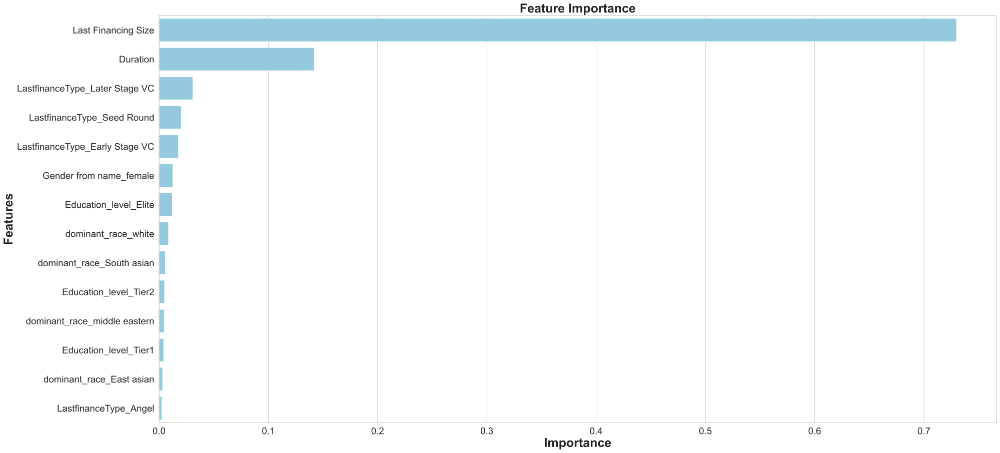

In [120]:
feats = {}
for feature, importance in zip(x_cols, rf.feature_importances_):
    feats[feature] = importance

importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
importances = importances.sort_values(by='Gini-Importance', ascending=False)
importances = importances.reset_index() 
importances = importances.rename(columns={'index': 'Features'})
sns.set(font_scale=5)
sns.set(style="whitegrid", color_codes=True, font_scale=1.7)
fig, ax = plt.subplots()
fig.set_size_inches(30, 15)
sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
plt.xlabel('Importance', fontsize=25, weight='bold')
plt.ylabel('Features', fontsize=25, weight='bold')
plt.title('Feature Importance', fontsize=25, weight='bold')
plt.show()